In [16]:
pip install seaborn

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ---------------------------------------- 0.0/11.6 MB ? eta -:--:--
   ---- ----------------------------------- 1.3/11.6 MB 8.4 MB/s eta 0:00:02
   ---------- ----------------------------- 3.1/11.6 MB 8.4 MB/s eta 0:00:02
   -------------- ------------------------- 4.2/11.6 MB 7.0 MB/s eta 0:00:02
   ------------------ --------------------- 5.2/11.6 MB 6.5 MB/s eta 0:00:01
   --------------------- ------------------ 6.3/11.6 MB 6.1 MB/s eta 0:00:01
   ------------------------- -------------- 7.3/11.6 MB 5.9 MB/s eta 0:00:01
   --------------------------- ------------ 8.1/11.6 MB 5.6 MB/s eta 0:00:01
   ------------------------------ --------- 8.9/11.6 MB 5.4 MB/s eta 0:00:01
   -------------------------------- ------- 9.4/11.6 MB 5.2 MB/s eta 0:00:01
   ---------------------------------- ----- 10.0/11.6 MB 5.0 MB/s eta 0:00:01
   ------------------------------------ --- 10.5/11.6 MB 4.6 MB/s eta 0:00:01
   -----

In [1]:
pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

Looking in indexes: https://download.pytorch.org/whl/cu117, https://pypi.ngc.nvidia.com
     ---------------------------------------- 0.0/2.3 GB ? eta -:--:--
     ---------------------------------------- 0.0/2.3 GB 23.1 MB/s eta 0:01:42
     ---------------------------------------- 0.0/2.3 GB 28.8 MB/s eta 0:01:22
     ---------------------------------------- 0.0/2.3 GB 25.7 MB/s eta 0:01:31
     ---------------------------------------- 0.0/2.3 GB 26.4 MB/s eta 0:01:29
     ---------------------------------------- 0.0/2.3 GB 28.1 MB/s eta 0:01:23
      --------------------------------------- 0.0/2.3 GB 32.7 MB/s eta 0:01:11
      --------------------------------------- 0.0/2.3 GB 31.3 MB/s eta 0:01:14
      --------------------------------------- 0.0/2.3 GB 31.7 MB/s eta 0:01:13
      --------------------------------------- 0.1/2.3 GB 29.0 MB/s eta 0:01:19
     - -------------------------------------- 0.1/2.3 GB 30.4 MB/s eta 0:01:16
     - -------------------------------------- 0.1/2

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [35]:
import torch
print(f"PyTorch: {torch.__version__}")
print(f"CUDA: {torch.version.cuda}")
print(f"GPU доступен: {torch.cuda.is_available()}")
print(f"Название GPU: {torch.cuda.get_device_name(0)}")

PyTorch: 2.0.1+cu117
CUDA: 11.7
GPU доступен: True
Название GPU: NVIDIA GeForce RTX 3060 Ti


In [ ]:
import torch
if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"Используем GPU: {torch.cuda.get_device_name(device)}")
else:
    print("Используем CPU")

Используем GPU: NVIDIA GeForce RTX 3060 Ti


In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import os
import numpy as np
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Используем устройство: {device}')

Используем устройство: cuda


In [ ]:
data_train = 'C:/Users/Krugl/Desktop/ВКР/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/'
data_valid = 'C:/Users/Krugl/Desktop/ВКР/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/'

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) 
])

train_dataset = datasets.ImageFolder(root=data_train, transform=transform)
val_dataset = datasets.ImageFolder(root=data_valid, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

In [ ]:
model = models.mobilenet_v2(weights='IMAGENET1K_V1')  

for param in model.parameters():
    param.requires_grad = False

model.classifier[1] = nn.Linear(model.classifier[1].in_features, len(train_dataset.classes))

model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
train_loss_history = []
train_acc_history = []
val_loss_history = []
val_acc_history = []

In [ ]:
total_params = sum(p.numel() for p in model.parameters())
print(f"Всего параметров: {total_params / 1e6:.2f} млн")

Всего параметров: 2.27 млн


In [ ]:
num_epochs = 10

for epoch in range(num_epochs):
    model.train()  
    running_loss = 0.0
    correct = 0
    total = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_accuracy = 100 * correct / total

    train_loss_history.append(train_loss)
    train_acc_history.append(train_accuracy)

    model.eval()  
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss /= len(val_loader)
    val_accuracy = 100 * correct / total

    val_loss_history.append(val_loss)
    val_acc_history.append(val_accuracy)

    print(f"Эпоха {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}% Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.2f}%")

torch.save(model.state_dict(), 'plant_disease_model.pth')

Эпоха 1/10, Train Loss: 0.4062, Train Acc: 90.75% Val Loss: 0.1415, Val Acc: 96.24%
Эпоха 2/10, Train Loss: 0.1538, Train Acc: 95.36% Val Loss: 0.1175, Val Acc: 96.28%
Эпоха 3/10, Train Loss: 0.1272, Train Acc: 95.99% Val Loss: 0.0948, Val Acc: 97.00%
Эпоха 4/10, Train Loss: 0.1155, Train Acc: 96.20% Val Loss: 0.1062, Val Acc: 96.37%
Эпоха 5/10, Train Loss: 0.1059, Train Acc: 96.50% Val Loss: 0.0851, Val Acc: 97.12%
Эпоха 6/10, Train Loss: 0.1023, Train Acc: 96.50% Val Loss: 0.0760, Val Acc: 97.51%
Эпоха 7/10, Train Loss: 0.0955, Train Acc: 96.70% Val Loss: 0.0866, Val Acc: 96.99%
Эпоха 8/10, Train Loss: 0.0957, Train Acc: 96.71% Val Loss: 0.0767, Val Acc: 97.46%
Эпоха 9/10, Train Loss: 0.0954, Train Acc: 96.69% Val Loss: 0.0806, Val Acc: 97.19%
Эпоха 10/10, Train Loss: 0.0940, Train Acc: 96.77% Val Loss: 0.0743, Val Acc: 97.50%


In [ ]:
import torch
from torchvision import models
import onnx
import onnxruntime as ort
import numpy as np

model = models.mobilenet_v2(pretrained=False)
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, len(train_dataset.classes))
model.load_state_dict(torch.load('plant_disease_model.pth'))
model.eval()

dummy_input = torch.randn(1, 3, 224, 224)
onnx_path = "plant_model.onnx"

torch.onnx.export(
    model,
    dummy_input,
    onnx_path,
    input_names=["input"],
    output_names=["output"],
    dynamic_axes={
        "input": {0: "batch_size"},
        "output": {0: "batch_size"}
    },
    opset_version=13
)

ort_session = ort.InferenceSession(onnx_path)
outputs = ort_session.run(None, {"input": dummy_input.numpy()})

print("ONNX модель успешно создана и работает корректно!")
print("Размер выходного тензора:", outputs[0].shape)

class_names = train_dataset.classes
with open("class_names.txt", "w") as f:
    f.write("\n".join(class_names))

print(f"Список классов сохранен в class_names.txt ({len(class_names)} классов)")

print("Параметры нормазации для Android:")
print("Mean: [0.485, 0.456, 0.406]")
print("Std: [0.229, 0.224, 0.225]")
print("Размер входного изображения: 224x224")

============= Diagnostic Run torch.onnx.export version 2.0.1+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================

ONNX модель успешно создана и работает корректно!
Размер выходного тензора: (1, 38)
Список классов сохранен в class_names.txt (38 классов)
Параметры нормазации для Android:
Mean: [0.485, 0.456, 0.406]
Std: [0.229, 0.224, 0.225]
Размер входного изображения: 224x224


In [43]:
from torchvision.utils import save_image
save_image(dummy_input, "test_input.jpg")

In [ ]:
model.eval()  
model = model.to(device)  

all_preds = []
all_labels = []

with torch.no_grad():  
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)  
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        
        all_preds.extend(predicted.cpu().numpy())  
        all_labels.extend(labels.cpu().numpy())

In [47]:
print(classification_report(all_labels, all_preds, target_names=train_dataset.classes))

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.98      0.98       504
                                 Apple___Black_rot       0.99      0.99      0.99       497
                          Apple___Cedar_apple_rust       1.00      0.97      0.98       440
                                   Apple___healthy       0.98      0.99      0.99       502
                               Blueberry___healthy       0.99      0.99      0.99       454
          Cherry_(including_sour)___Powdery_mildew       0.99      0.99      0.99       421
                 Cherry_(including_sour)___healthy       1.00      1.00      1.00       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.97      0.91      0.94       410
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       477
               Corn_(maize)___Northern_Leaf_Blight       0.92      0.97      0.

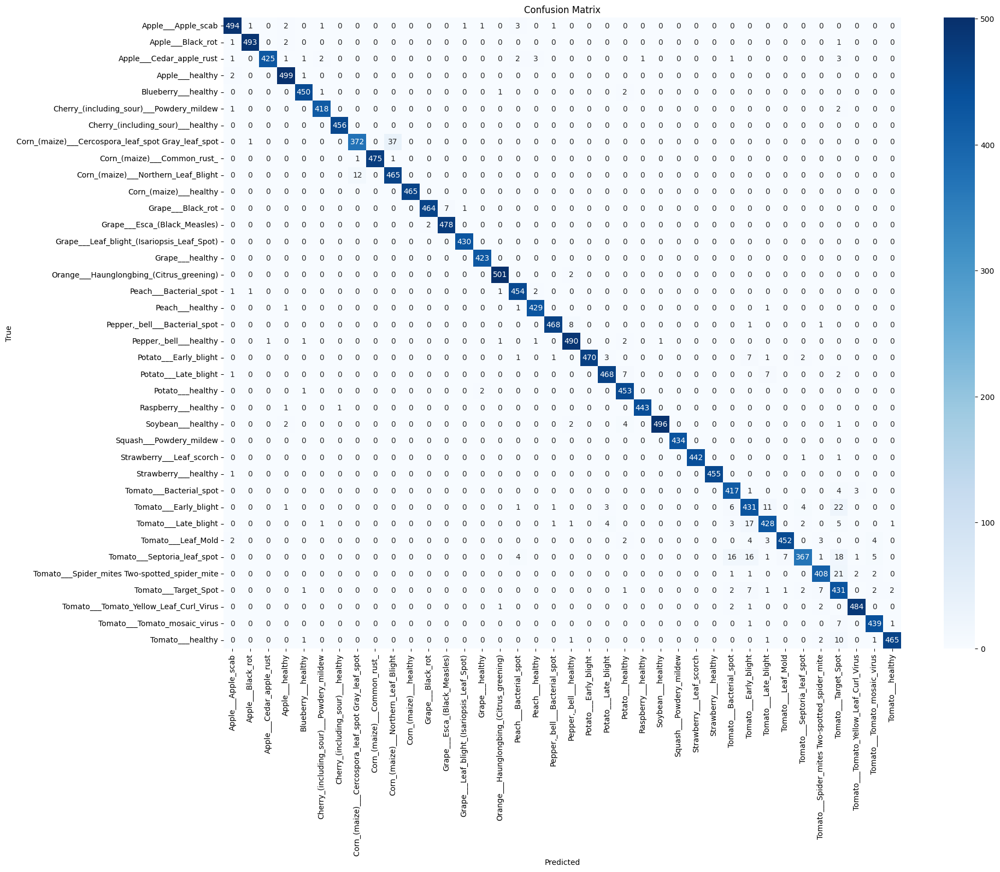

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=train_dataset.classes, 
            yticklabels=train_dataset.classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

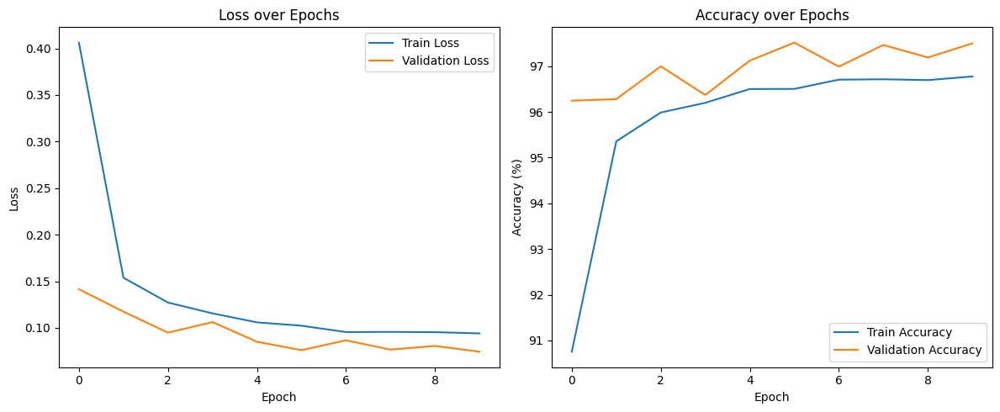

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_loss_history, label='Train Loss')
plt.plot(val_loss_history, label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_acc_history, label='Train Accuracy')
plt.plot(val_acc_history, label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.tight_layout()
plt.show()

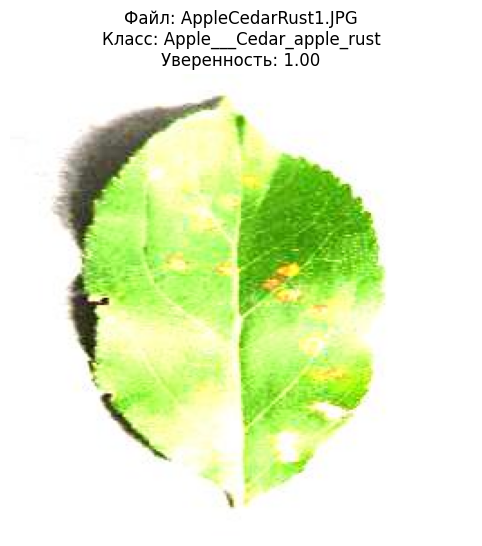

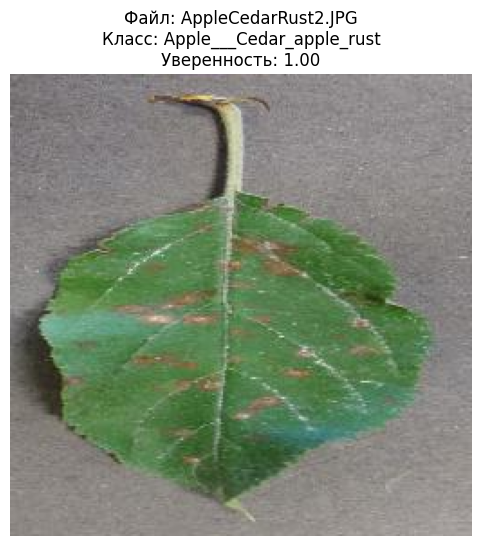

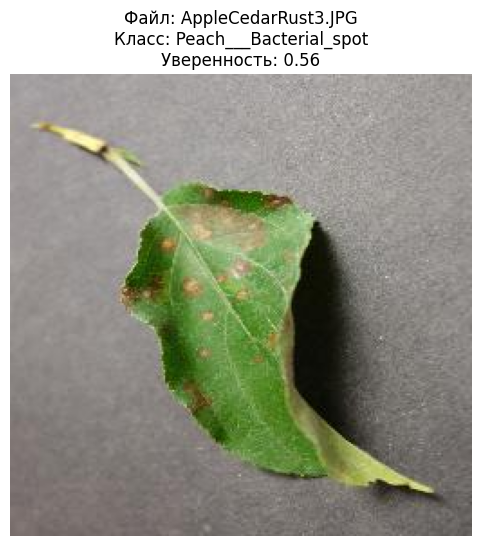

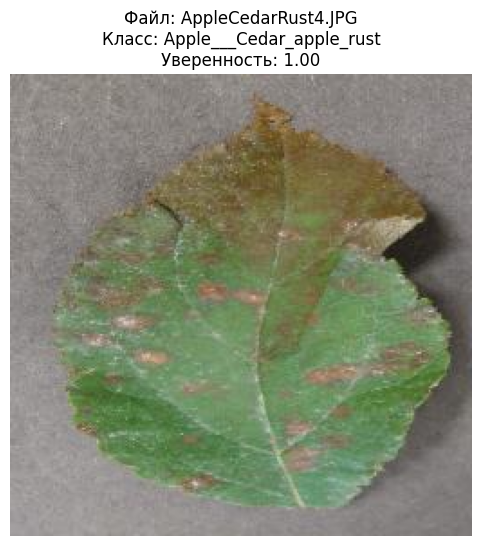

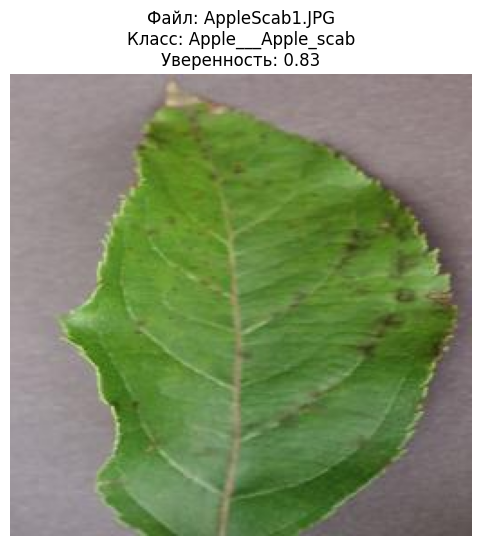

...

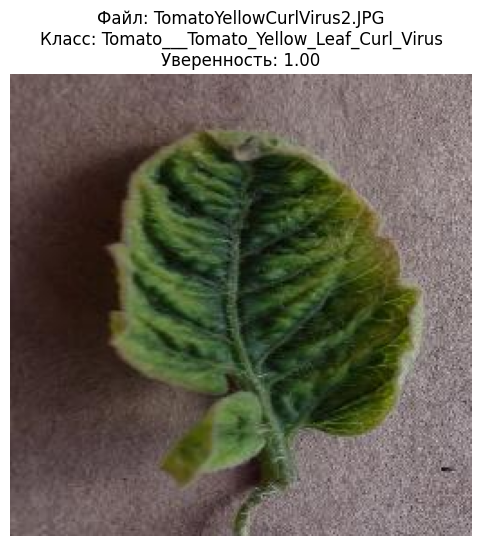

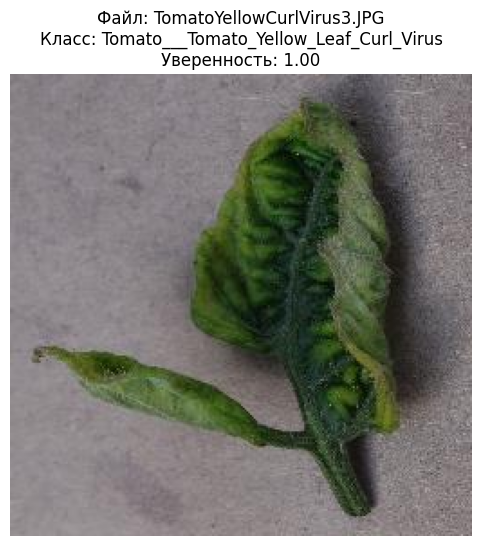

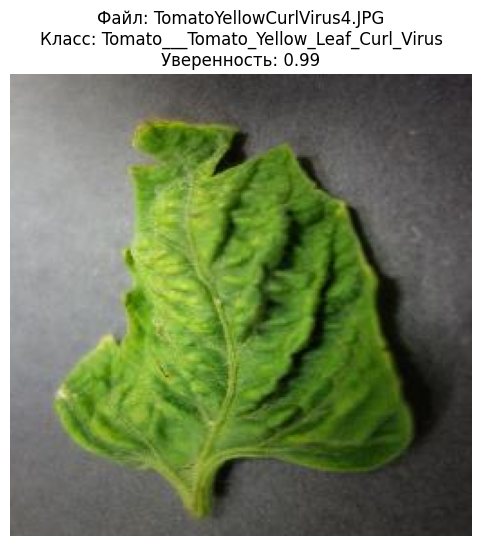

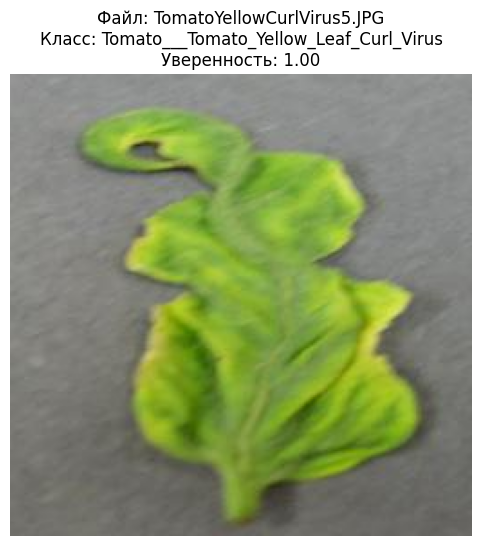

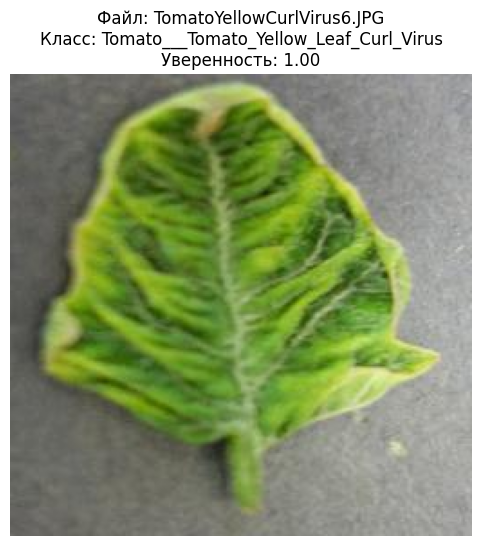

In [ ]:
test_dir = 'C:/Users/Krugl/Desktop/ВКР/archive/test/test'
test_images = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
class_names = train_dataset.classes

if not test_images:
    print("В папке нет изображений!")
else:
    for img_name in test_images:
        img_path = os.path.join(test_dir, img_name)
        
        try:
            img = Image.open(img_path)
            img_tensor = transform(img).unsqueeze(0).to(device)
            
            model.eval()
            with torch.no_grad():
                output = model(img_tensor)
                probabilities = torch.nn.functional.softmax(output[0], dim=0)
                predicted_idx = torch.argmax(probabilities).item()
                predicted_class = class_names[predicted_idx]
                confidence = probabilities[predicted_idx].item()
            
            plt.figure(figsize=(8, 6))
            plt.imshow(img)
            plt.title(f"Файл: {img_name}\nКласс: {predicted_class}\nУверенность: {confidence:.2f}", fontsize=12)
            plt.axis('off')
            plt.show()
            
        except Exception as e:
            print(f"Ошибка при обработке {img_name}: {str(e)}")